In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
from typing import List
from __future__ import annotations  # Forward references automatically handled
from PIL import Image
from IPython.display import Image as IPImage, display
import os
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import shutil

In [3]:
# helper functions
def limit_vector_magnitude(vector, max_magnitude):
	magnitude = np.linalg.norm(vector)
	if magnitude > max_magnitude:
		return (vector / magnitude) * max_magnitude
	return vector

def get_distance(vector1, vector2):
	return np.linalg.norm(vector1 - vector2)

In [5]:
class Cage:
	def __init__(self, center_position=(0,0), radius = 500):
		self.position = np.asarray(center_position)
		self.tup_position = center_position
		self.radius = radius

In [6]:
class LoggingData:
	def __init__(self):
		self.step = []
		self.predator_position = {}
		self.prey_position = []
		self.predator_reward = []

In [7]:
class Logging:
	def __init__(self):
		self.step = []
		self.position = []
		self.velocity = []
		self.acceleration = []
		self.stamina = []

In [8]:
from enum import Enum

class AgentType(Enum):
	AgentTypePredator = "PREDATOR"
	AgentTypePrey = "PREY"
	AgentTypeNone = "NONE"

In [9]:
class MessageBus:
	def __init__(self):
		self.message = [] # array of dictionary


# {
#     "from": <predator_id>,
#     "message": <message>
# }

In [10]:
class Agent:
	def __init__(self, position=(0,0), agent_type:AgentType = AgentType.AgentTypeNone):
		self.id = np.random.randint(100000)
		self.position = np.asarray(position)
		self.agent_type = agent_type
		self.initial_position = np.asarray(position)
		self.logging = Logging()

	def step(self):
		return self.position

In [74]:
class Prey(Agent):
	def __init__(self, cage, position=(0,0), velocity=[0,0], behavior = 0, max_speed = 5, max_acceleration = 12, stamina = 10):
		super().__init__(position, AgentType.AgentTypePrey)
		self.velocity = limit_vector_magnitude(np.asarray(velocity), 1)
		self.acceleration = limit_vector_magnitude(np.asarray(velocity), 1)
		
		self.max_speed = max_speed
		self.max_acceleration = max_acceleration
		
		self.behavior = behavior

		self.initial_position = np.copy(self.position)
		self.initial_velocity = np.copy(self.velocity)

		self.cage = cage

		self.previous_position = np.copy(self.position)
		self.previous_velocity = np.copy(self.velocity)

		self.stamina = stamina

	def reset(self):
		self.position = np.copy(self.initial_position)
		self.velocity = np.copy(self.initial_velocity)

	def step(self, delta, predators):
		next_velocity = np.zeros(2)
		next_position = np.zeros(2)
		acceleration = np.zeros(2)
		
		# DEBUGGING USE ONLY
		if self.behavior == 0:
			acceleration = self.move_straight_line()
			next_velocity = self.velocity + limit_vector_magnitude(acceleration, self.max_acceleration) * delta
			next_position = self.position + next_velocity * delta

		# DONT USE THIS
		# move away from average predator velocity
		elif self.behavior == 1:
			move_average_velocity = self.move_from_average(predators)
			move_to_outer_circle = self.move_to_outside_circle()
			acceleration = move_average_velocity + move_to_outer_circle
			acceleration = limit_vector_magnitude(acceleration, self.max_acceleration)

			next_velocity = self.velocity + acceleration * delta
			next_velocity = limit_vector_magnitude(next_velocity, self.max_speed)

		# move away from average predator position
		elif self.behavior == 2:
			move_average_position = self.move_away_from_predators(predators)
			move_to_outer_circle = self.move_to_outside_circle()
			
			force = move_average_position + move_to_outer_circle
			
			acceleration = limit_vector_magnitude(force, self.max_acceleration)

			next_velocity = self.velocity + acceleration * delta
			next_velocity = limit_vector_magnitude(force, self.max_speed)

		
		# logging state
		self.logging.position.append(self.position)
		self.logging.velocity.append(self.velocity)
		self.logging.acceleration.append(self.acceleration)
		self.logging.stamina.append(self.stamina)

		# update state
		next_position = self.position + next_velocity * delta

		self.previous_velocity = self.velocity
		self.velocity = next_velocity
		self.previous_position = self.position
		self.position = next_position

		return self.position

	# compute the average velocity directions of predators
	def average_velocity(self, predators):
		velocity_arr = np.asarray([p.velocity for p in predators])
		total_velocity = np.sum(velocity_arr, axis=0)
		average_velocity = total_velocity / len(predators)
		return limit_vector_magnitude(average_velocity, self.max_speed)

	def move_from_average(self, predators):
		# move to averge velocity of prey
		next_velocity = self.average_velocity(predators)
		return limit_vector_magnitude(next_velocity, self.max_speed)

	def move_to_outside_circle(self):
		# move to outside circle
		next_velocity = (self.position - self.cage.position)
		return limit_vector_magnitude(next_velocity, self.max_speed)

	def move_straight_line(self):
		return self.velocity

	def move_away_from_predators(self, predators):
		average_arr = np.asarray([self.position - p.previous_position for p in predators])
		total_dir = np.sum(average_arr, axis=0)
		average_dir = total_dir/len(predators)

		return average_dir

In [75]:
class Predator(Agent):
	def __init__(self, position=(0,0), behavior_type = 0, speed=1.2, max_acceleration=1.1, stamina = 10, stamina_treshold = 7.0):
		super().__init__(position, AgentType.AgentTypePredator)

		self.speed = speed
		self.max_acceleration = max_acceleration
		
		self.velocity = limit_vector_magnitude(np.asarray([1,1]), 1)
		self.initial_velocity = np.copy(self.velocity)

		self.behavior_type = behavior_type

		self.previous_position = np.copy(self.position)

		self.stamina = stamina

		self.stamina_treshold = stamina_treshold
	
	def reset(self):
		self.position = np.copy(self.initial_position)
		self.velocity = np.copy(self.initial_velocity)

	def step(self, stepno, delta, prey, predators, messagebus: MessageBus):
		# print(f"step number: {stepno} id {self.id} behavior type {self.behavior_type}")
		policy, msg = self.policy(prey, predators, messagebus)
		# print(f"step number: {stepno} id {self.id} message bus {messagebus.message}")
		
		acceleration = limit_vector_magnitude(policy, self.max_acceleration)
		next_velocity = self.velocity + acceleration * delta
		next_velocity = limit_vector_magnitude(next_velocity, self.speed)
		
		next_position = self.position + next_velocity * delta

		# log state
		self.logging.position.append(self.position)
		self.logging.velocity.append(self.velocity)
		self.logging.acceleration.append(acceleration)
		self.logging.stamina.append(self.stamina)
		
		# update state
		self.velocity = next_velocity
		self.previous_position = self.position
		self.position = next_position

		stamina_rate = 1.0
		if self.behavior_type == 1:
			stamina_rate = 3.0
			
		self.stamina = self.stamina - stamina_rate * delta
		
		return self.position, msg

	def policy(self, prey, predators, messagebus):
		# other_stamina = np.max(np.asarray([p.stamina for p in predators]))
		# print(f"{other_stamina} {self.stamina}")

		msg = {}
		# kalau capek ganti ke 0
		# kalau lebih punya stamina ganti ke 1
		if self.is_tired(predators):
			print(f"{self.id} is tired")
			msg = {
					"from": self.id,
					"message": "SWITCH"
				}

		messagebus_ = messagebus
		# check if there is a message
		if len(messagebus_) > 0:
			msg_ = messagebus_[-1]
			# print(f"im {self.id} message bus {msg_}")
			if msg_["from"] != 0:
				if msg_["from"] != self.id and self.behavior_type == 0:
					# print(f"I {self.id} received message {msg_}")
					if msg_["message"] == "SWITCH":
						self.change_behavior(1)

		print(f"msg {msg}")
		if self.behavior_type == 0:
			return self.greedy_chase(prey), msg
		elif self.behavior_type == 1:
			return self.blocker(prey), msg
		
	def greedy_chase(self, prey):
		return (prey.previous_position - self.position)

	def blocker(self, prey):
		return (prey.previous_position + prey.previous_velocity * 10) - self.position
	
	def is_tired(self, predators):
		other_stamina = np.max(np.asarray([p.stamina for p in predators]))
		
		if other_stamina - self.stamina > self.stamina_treshold and self.behavior_type == 1:
			self.change_behavior(0)
			return True
		
		return False

	def change_behavior(self, behavior):
		self.behavior_type = behavior

In [76]:
class World:
	def __init__(self, cage, prey, delta = 0.02, predators=[], scenario = ""):
		self.predators = predators
		self.prey = prey
		self.agents = [self.prey] + self.predators

		self.cage = cage

		self.delta = delta # in miliseconds
		
		self.messagebus = MessageBus()

		self.log_data = {
			"episode": [] # array of LoggingData
		}
		
		self.scenario = scenario

		folder_path = f"./{self.scenario}"
		if os.path.exists(folder_path):
			shutil.rmtree(folder_path)
		os.mkdir(folder_path)
		

	def simulate(self, episodes, max_steps, min_distance):
		for i in tqdm(range(episodes), desc="Simulating.."):
			# time.sleep(0.01) # artificial delay so the tqdm can work

			logging_data = LoggingData()

			# init predator position
			for j in range(len(self.predators)):
				logging_data.predator_position[self.predators[j].id] = []
				self.predators[j].reset()

			# init prey position
			self.prey.reset()

			is_catched = False
			
			next_msg = []
			
			for j in range(max_steps):
				print(f"step {j} message bus {next_msg}")
				if is_catched:
					break
				logging_data.step.append(j)
				msg = []
				for agent in self.agents:
					if agent.agent_type == AgentType.AgentTypePredator:
						# Get other predators
						other_predators = [_predator for _predator in self.predators if agent.id != _predator.id]

						position, msg_ = agent.step(j, self.delta, self.prey, other_predators, next_msg)

						# check if msg_ is empty
						if msg_:
							msg.append(msg_)
							
						logging_data.predator_position[agent.id].append(position)

						# check is the predator catches the prey
						if get_distance(self.prey.position, agent.position) < min_distance:
							print(f"Predator catched prey at step {j}")
							is_catched = True
					
					elif agent.agent_type == AgentType.AgentTypePrey:
						position = agent.step(self.delta, self.predators)
						logging_data.prey_position.append(position)

				# check is the prey managed to escape
				if get_distance(self.prey.position, self.cage.position) >= self.cage.radius:
					print(f"Prey escaped at step {j}")
					is_catched = True

				if len(msg) > 0:
					next_msg = msg
				else:
					next_msg = []
					
				print(f"msg = {msg}")

			self.log_data["episode"].append(logging_data)
		

	def animate(self, selected_episode):
		frames = []
		
		folder_path = f"./{self.scenario}/episode{selected_episode}"
		if os.path.exists(folder_path):
			shutil.rmtree(folder_path)
		os.mkdir(folder_path)
		
		selected_log = self.log_data["episode"][selected_episode]

		for idx, step in enumerate(range(len(selected_log.step))):
			fig, axes = plt.subplots(figsize=(12, 6))

			# Draw the cage
			circ = plt.Circle(self.cage.tup_position, self.cage.radius, fill=False)
			axes.add_patch(circ)
			
			for agent in self.agents:
				position = agent.logging.position[idx]
				
				if agent.agent_type == AgentType.AgentTypePredator:
					axes.scatter(position[0], position[1], c='red', s=10)  # Predator
				else:
					axes.scatter(position[0], position[1], c='blue', s=10)  # Prey

			axes.set_title(f'Positions of Predator and Prey at step {step}')
			axes.set_xlabel('X Position')
			axes.set_ylabel('Y Position')
			axes.set_aspect('equal', adjustable='box')
			
			
			plt.close(fig)
			frame_path = f"./{folder_path}/frame_{step}.png"
			fig.savefig(frame_path)
			frames.append(frame_path)

		images = [Image.open(frame) for frame in frames]
		gif_path = f"./{folder_path}/episode_{selected_episode}.gif"
		images[0].save(gif_path, save_all=True, append_images=images[1:], loop=0, duration=100)

		display(IPImage(gif_path))

		# Cleanup
		for frame in frames:
			os.remove(frame)


	# plot the position of each agent
	def plot(self, selected_episode):
		fig, axes = plt.subplots(figsize=(12, 12))

		selected_log = self.log_data["episode"][selected_episode]

		for idx, agent in enumerate(self.agents):
			positions = agent.logging.position
			for position in positions:
				if agent.agent_type == AgentType.AgentTypePredator:
					axes.scatter(position[0], position[1], c='red', s=10)  # Predator
				else:
					axes.scatter(position[0], position[1], c='blue', s=10)  # Prey
				
		# Draw the cage
		circ = plt.Circle(self.cage.tup_position, self.cage.radius, fill=False)
		axes.add_patch(circ)
		
		axes.set_title('Positions of Predator and Prey')
		axes.set_xlabel('X Position')
		axes.set_ylabel('Y Position')
		axes.grid()
		axes.set_aspect('equal', adjustable='box')

		# Line plot of the distance
		# predator_positions = np.array(selected_log.predator_position)
		# prey_positions = np.array(selected_log.prey_position)
		# distances = np.linalg.norm(predator_positions - prey_positions, axis=1)
		# axes[0][1].plot(selected_log.step, distances, label='Distance', color='green')
		# axes[0][1].set_title('Distance Over Time')
		# axes[0][1].set_xlabel('Step')
		# axes[0][1].set_ylabel('Distance')
		# axes[0][1].legend()
		# axes[0][1].grid()

		# plot the reward over time
		# axes[1][0].plot(selected_log.step, selected_log.predator_reward, label='Reward', color='orange')
		# axes[1][0].set_title('Reward Over Time')
		# axes[1][0].legend()
		# axes[1][0].grid()

		plt.tight_layout()
		plt.show()

	def plot_stamina(self, selected_episode):
		fig, axes = plt.subplots(len(self.agents),figsize=(12, 12))

		steps = self.log_data["episode"][selected_episode].step

		for idx, agent in enumerate(self.agents):
			stamina = agent.logging.stamina
			axes[idx].plot(steps, stamina, label=agent.agent_type)
			axes[idx].set_title("Stamina Over Time")
			axes[idx].set_xlabel('Step')
			axes[idx].set_ylabel('Stamina')
			axes[idx].legend()
			axes[idx].grid()

		plt.tight_layout()
		plt.show()

## Scenario 1.1

In [109]:
num_episodes = 1
max_steps = 3000
min_distance = 3
delta = 0.05
stamina_treshold=3.0

cage = Cage((100,100),100)
predators = [Predator(position=(50,100),behavior_type=0, speed=12, max_acceleration=11, stamina_treshold = stamina_treshold),
			 Predator(position=(100,50),behavior_type=1, speed=8, max_acceleration=10, stamina_treshold = stamina_treshold)]
prey = Prey(cage, position=(110,100), velocity=[1,0], behavior=2, max_speed = 4, max_acceleration = 7)
world = World(cage, prey, delta, predators, "world_default")
world.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1 [00:00<?, ?it/s]

step 0 message bus []
msg {}
msg {}
msg = []
step 1 message bus []
msg {}
msg {}
msg = []
step 2 message bus []
msg {}
msg {}
msg = []
step 3 message bus []
msg {}
msg {}
msg = []
step 4 message bus []
msg {}
msg {}
msg = []
step 5 message bus []
msg {}
msg {}
msg = []
step 6 message bus []
msg {}
msg {}
msg = []
step 7 message bus []
msg {}
msg {}
msg = []
step 8 message bus []
msg {}
msg {}
msg = []
step 9 message bus []
msg {}
msg {}
msg = []
step 10 message bus []
msg {}
msg {}
msg = []
step 11 message bus []
msg {}
msg {}
msg = []
step 12 message bus []
msg {}
msg {}
msg = []
step 13 message bus []
msg {}
msg {}
msg = []
step 14 message bus []
msg {}
msg {}
msg = []
step 15 message bus []
msg {}
msg {}
msg = []
step 16 message bus []
msg {}
msg {}
msg = []
step 17 message bus []
msg {}
msg {}
msg = []
step 18 message bus []
msg {}
msg {}
msg = []
step 19 message bus []
msg {}
msg {}
msg = []
step 20 message bus []
msg {}
msg {}
msg = []
step 21 message bus []
msg {}
msg {}
msg = [

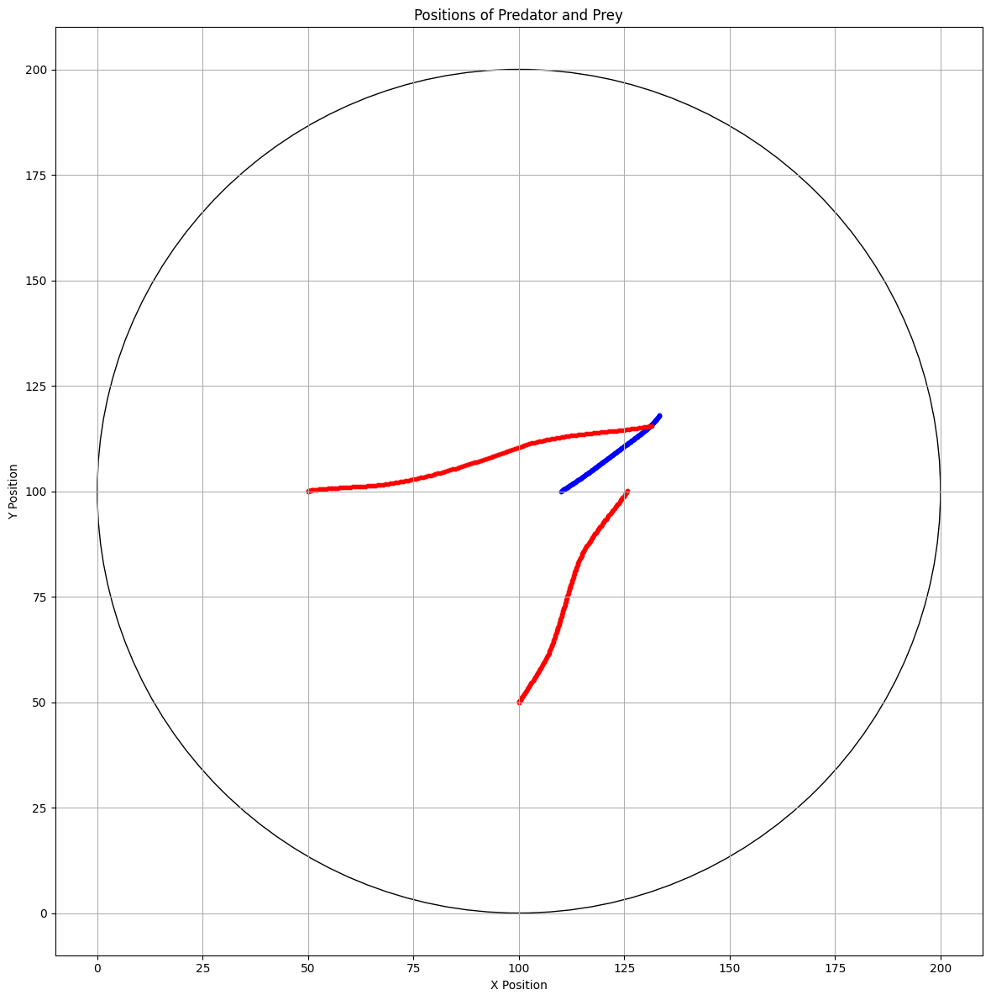

In [110]:
world.plot(0)

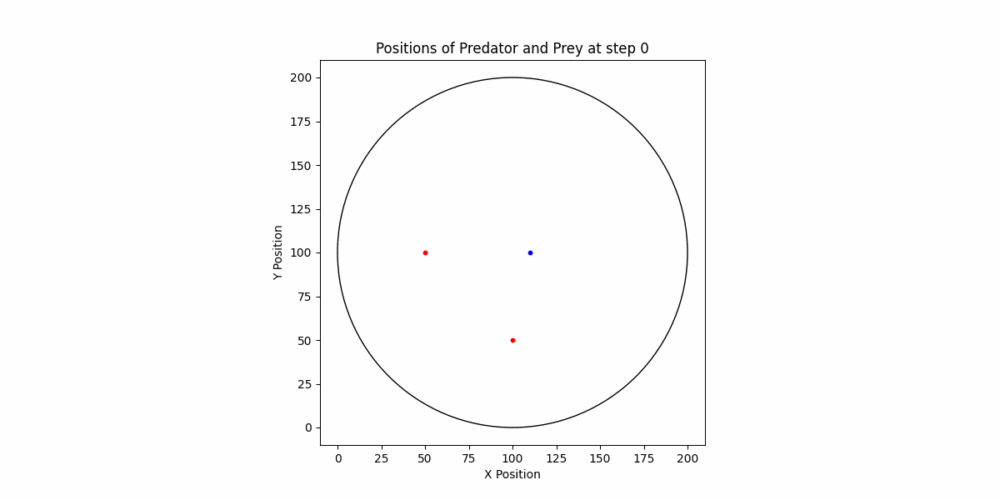

In [111]:
world.animate(0)

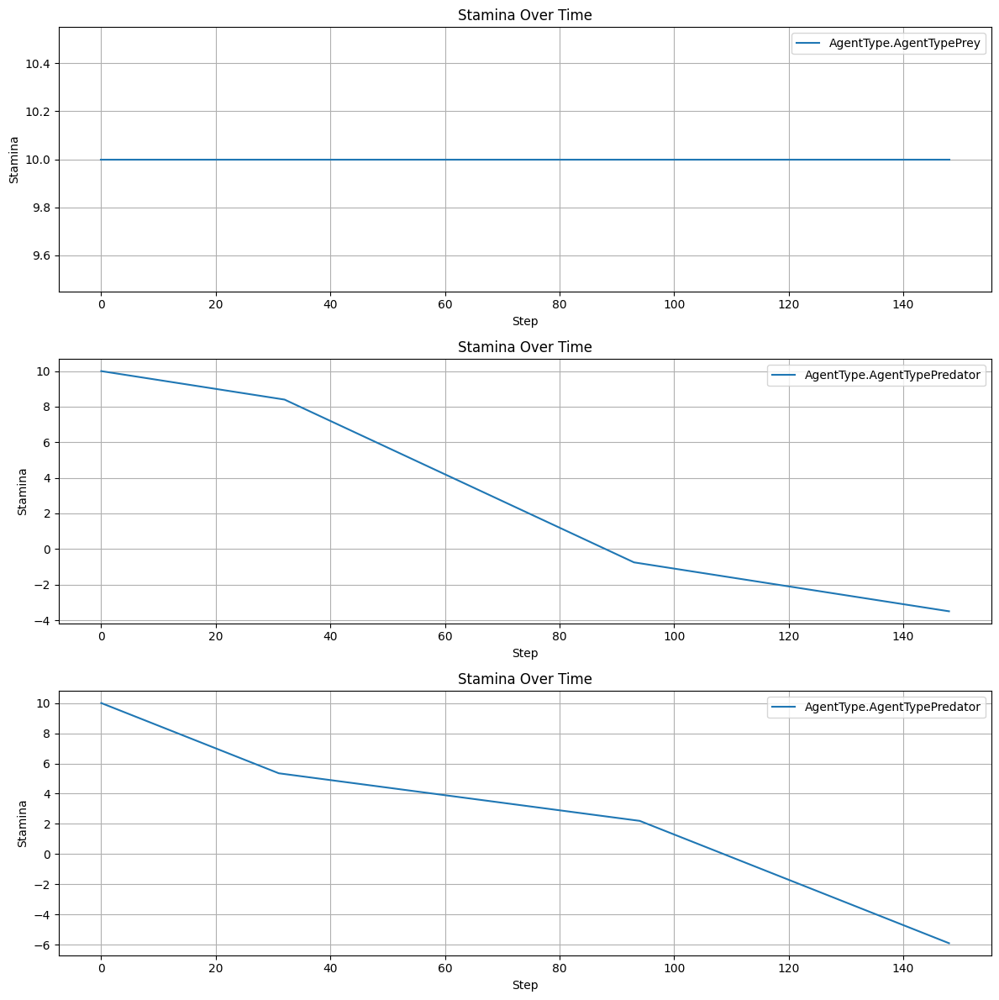

In [112]:
world.plot_stamina(0)

## Scenario 1.2

In [105]:
num_episodes = 1
max_steps = 3000
min_distance = 3
delta = 0.05
stamina_treshold=7.0

cage = Cage((100,100),100)
predators = [Predator(position=(50,100),behavior_type=0, speed=12, max_acceleration=11, stamina_treshold = stamina_treshold),
			 Predator(position=(100,50),behavior_type=1, speed=8, max_acceleration=10, stamina_treshold = stamina_treshold)]
prey = Prey(cage, position=(110,100), velocity=[1,0], behavior=2, max_speed = 4, max_acceleration = 7)
world1 = World(cage, prey, delta, predators, "world_default")
world1.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1 [00:00<?, ?it/s]

step 0 message bus []
msg {}
msg {}
msg = []
step 1 message bus []
msg {}
msg {}
msg = []
step 2 message bus []
msg {}
msg {}
msg = []
step 3 message bus []
msg {}
msg {}
msg = []
step 4 message bus []
msg {}
msg {}
msg = []
step 5 message bus []
msg {}
msg {}
msg = []
step 6 message bus []
msg {}
msg {}
msg = []
step 7 message bus []
msg {}
msg {}
msg = []
step 8 message bus []
msg {}
msg {}
msg = []
step 9 message bus []
msg {}
msg {}
msg = []
step 10 message bus []
msg {}
msg {}
msg = []
step 11 message bus []
msg {}
msg {}
msg = []
step 12 message bus []
msg {}
msg {}
msg = []
step 13 message bus []
msg {}
msg {}
msg = []
step 14 message bus []
msg {}
msg {}
msg = []
step 15 message bus []
msg {}
msg {}
msg = []
step 16 message bus []
msg {}
msg {}
msg = []
step 17 message bus []
msg {}
msg {}
msg = []
step 18 message bus []
msg {}
msg {}
msg = []
step 19 message bus []
msg {}
msg {}
msg = []
step 20 message bus []
msg {}
msg {}
msg = []
step 21 message bus []
msg {}
msg {}
msg = [

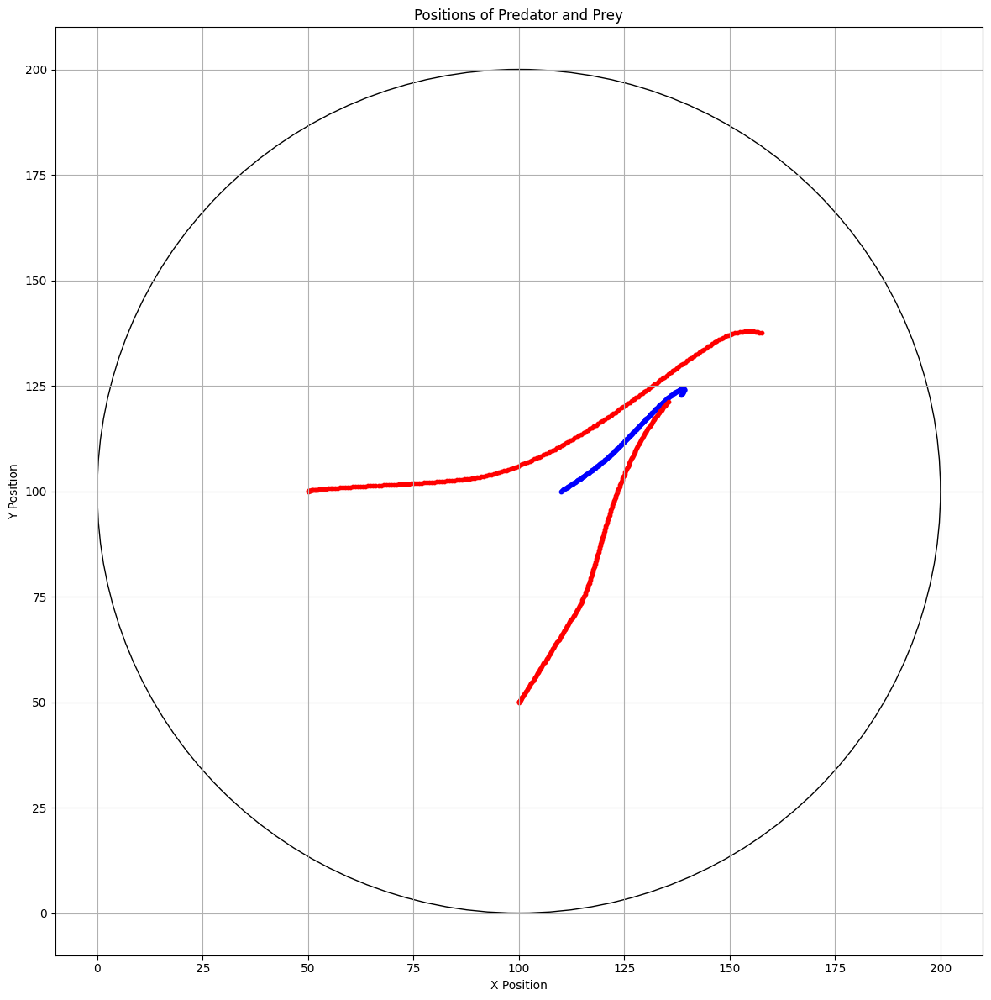

In [106]:
world1.plot(0)

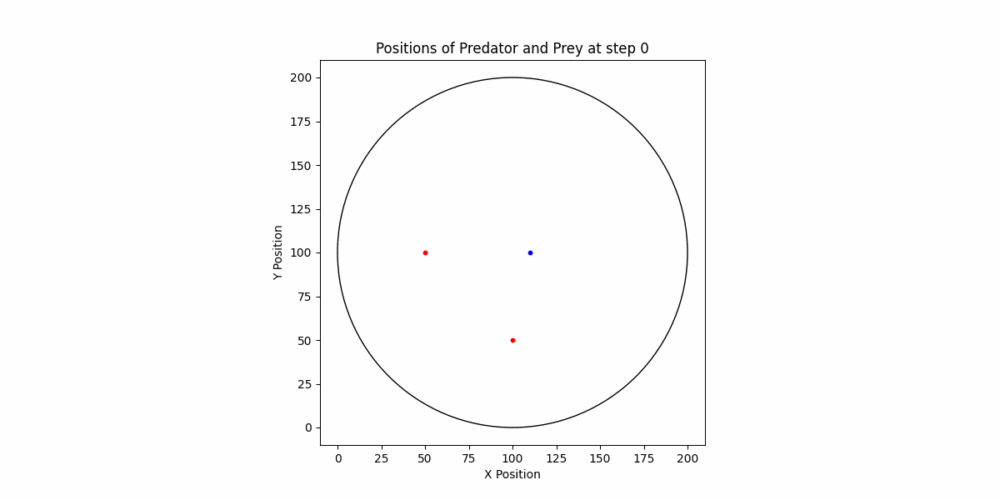

In [107]:
world1.animate(0)

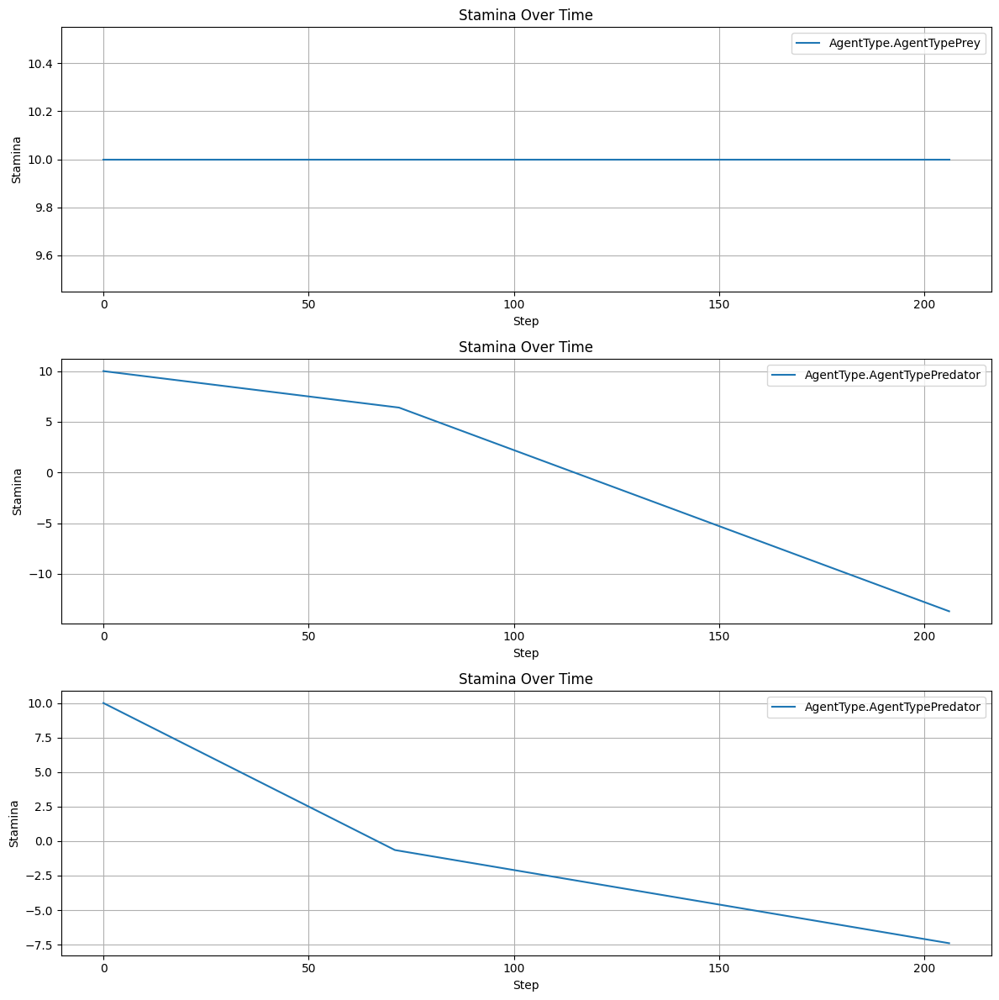

In [108]:
world1.plot_stamina(0)

## Scenario 2 (2-way pursue)

In [113]:
num_episodes = 1
max_steps = 1000
min_distance = 2
delta = 0.05
stamina_treshold = 3.0

cage = Cage((100,100),100)
predators = [Predator(position=(180,50),behavior_type=0, speed=12, max_acceleration=11, stamina_treshold=stamina_treshold),
			 Predator(position=(50,50),behavior_type=1, speed=8, max_acceleration=10, stamina_treshold=stamina_treshold)]
prey = Prey(cage, position=(110,50), velocity=[1,0], behavior=2, max_speed = 4, max_acceleration = 7)
world2 = World(cage, prey, delta, predators, "scenario_2")
world2.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1 [00:00<?, ?it/s]

step 0 message bus []
msg {}
msg {}
msg = []
step 1 message bus []
msg {}
msg {}
msg = []
step 2 message bus []
msg {}
msg {}
msg = []
step 3 message bus []
msg {}
msg {}
msg = []
step 4 message bus []
msg {}
msg {}
msg = []
step 5 message bus []
msg {}
msg {}
msg = []
step 6 message bus []
msg {}
msg {}
msg = []
step 7 message bus []
msg {}
msg {}
msg = []
step 8 message bus []
msg {}
msg {}
msg = []
step 9 message bus []
msg {}
msg {}
msg = []
step 10 message bus []
msg {}
msg {}
msg = []
step 11 message bus []
msg {}
msg {}
msg = []
step 12 message bus []
msg {}
msg {}
msg = []
step 13 message bus []
msg {}
msg {}
msg = []
step 14 message bus []
msg {}
msg {}
msg = []
step 15 message bus []
msg {}
msg {}
msg = []
step 16 message bus []
msg {}
msg {}
msg = []
step 17 message bus []
msg {}
msg {}
msg = []
step 18 message bus []
msg {}
msg {}
msg = []
step 19 message bus []
msg {}
msg {}
msg = []
step 20 message bus []
msg {}
msg {}
msg = []
step 21 message bus []
msg {}
msg {}
msg = [

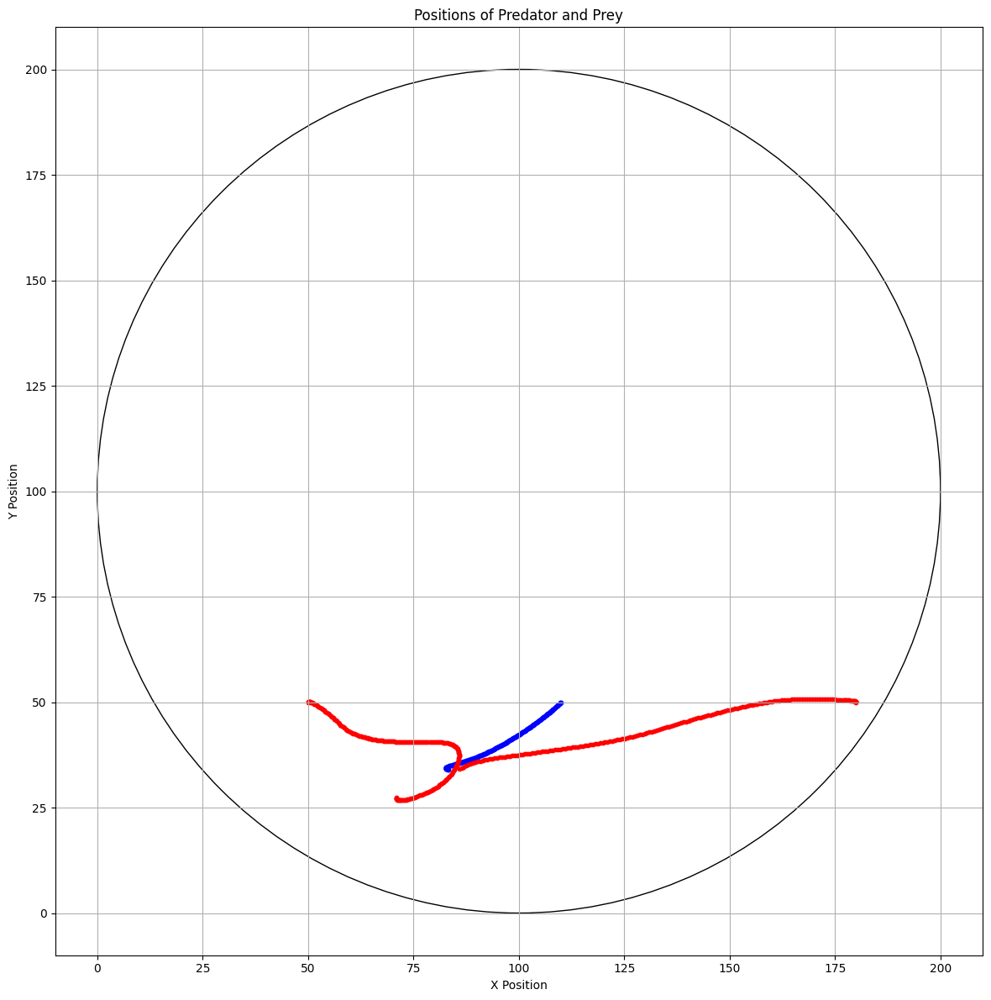

In [114]:
world2.plot(0)

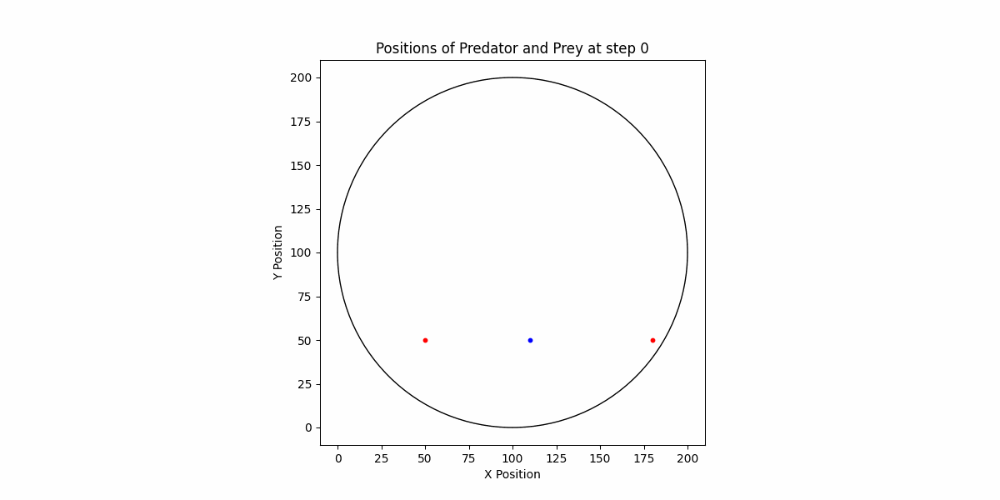

In [115]:
world2.animate(0)

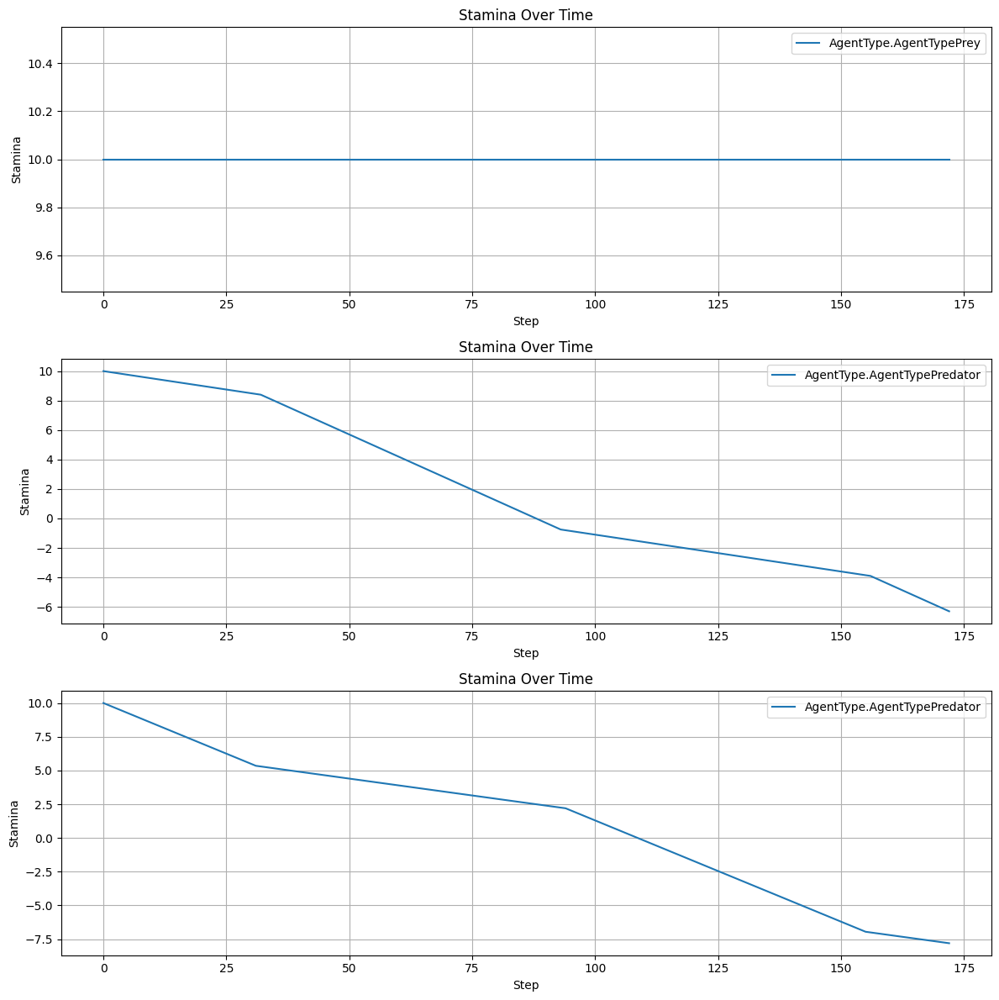

In [116]:
world2.plot_stamina(0)

## Scenario 2.2

In [117]:
num_episodes = 1
max_steps = 1000
min_distance = 2
delta = 0.05
stamina_treshold = 3.0

cage = Cage((100,100),100)
predators = [Predator(position=(180,50),behavior_type=0, speed=12, max_acceleration=11, stamina_treshold=stamina_treshold),
			 Predator(position=(50,50),behavior_type=1, speed=8, max_acceleration=10, stamina_treshold=stamina_treshold)]
prey = Prey(cage, position=(110,50), velocity=[1,0], behavior=2, max_speed = 4, max_acceleration = 7)
world3 = World(cage, prey, delta, predators, "scenario_2")
world3.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1 [00:00<?, ?it/s]

step 0 message bus []
msg {}
msg {}
msg = []
step 1 message bus []
msg {}
msg {}
msg = []
step 2 message bus []
msg {}
msg {}
msg = []
step 3 message bus []
msg {}
msg {}
msg = []
step 4 message bus []
msg {}
msg {}
msg = []
step 5 message bus []
msg {}
msg {}
msg = []
step 6 message bus []
msg {}
msg {}
msg = []
step 7 message bus []
msg {}
msg {}
msg = []
step 8 message bus []
msg {}
msg {}
msg = []
step 9 message bus []
msg {}
msg {}
msg = []
step 10 message bus []
msg {}
msg {}
msg = []
step 11 message bus []
msg {}
msg {}
msg = []
step 12 message bus []
msg {}
msg {}
msg = []
step 13 message bus []
msg {}
msg {}
msg = []
step 14 message bus []
msg {}
msg {}
msg = []
step 15 message bus []
msg {}
msg {}
msg = []
step 16 message bus []
msg {}
msg {}
msg = []
step 17 message bus []
msg {}
msg {}
msg = []
step 18 message bus []
msg {}
msg {}
msg = []
step 19 message bus []
msg {}
msg {}
msg = []
step 20 message bus []
msg {}
msg {}
msg = []
step 21 message bus []
msg {}
msg {}
msg = [

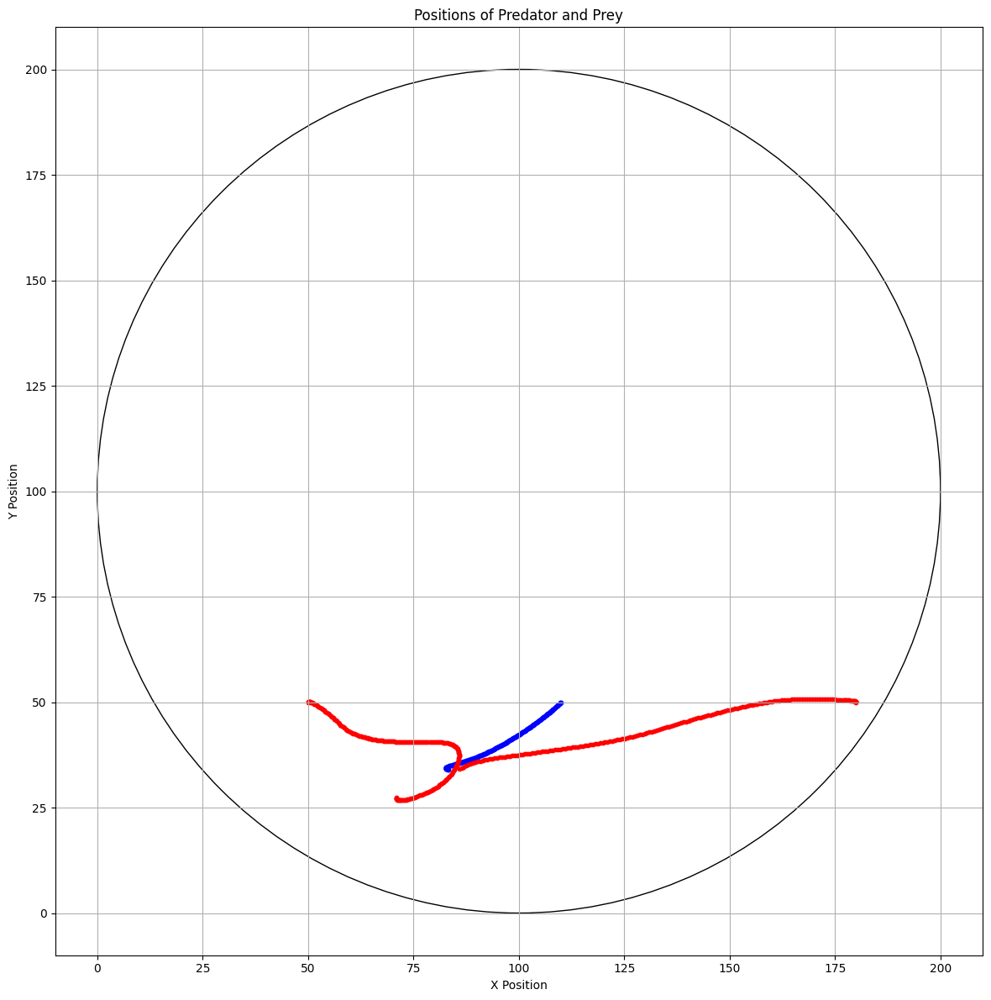

In [118]:
world3.plot(0)

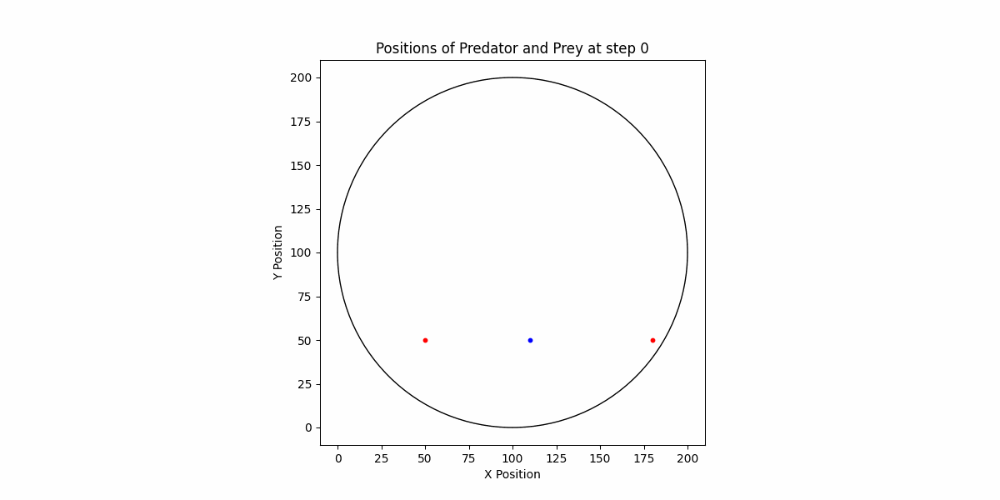

In [119]:
world3.animate(0)

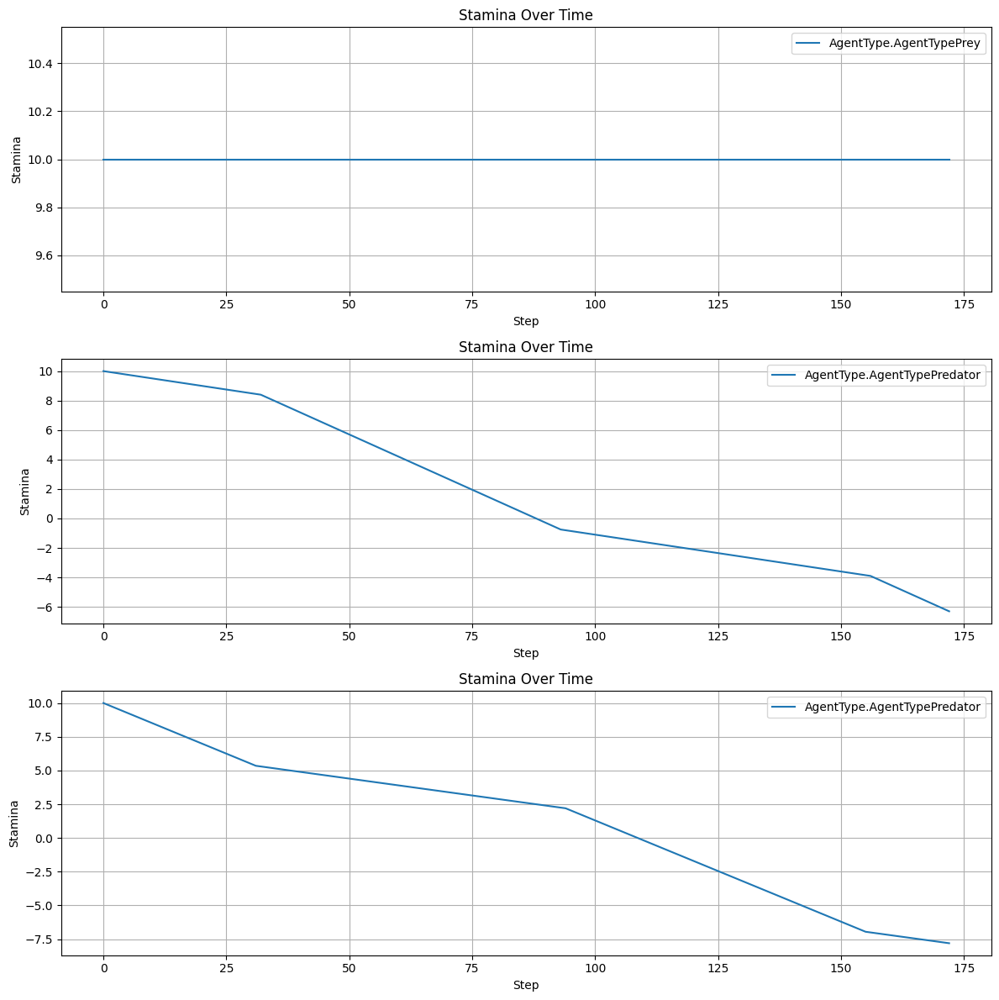

In [120]:
world3.plot_stamina(0)

## Saved Trials 2

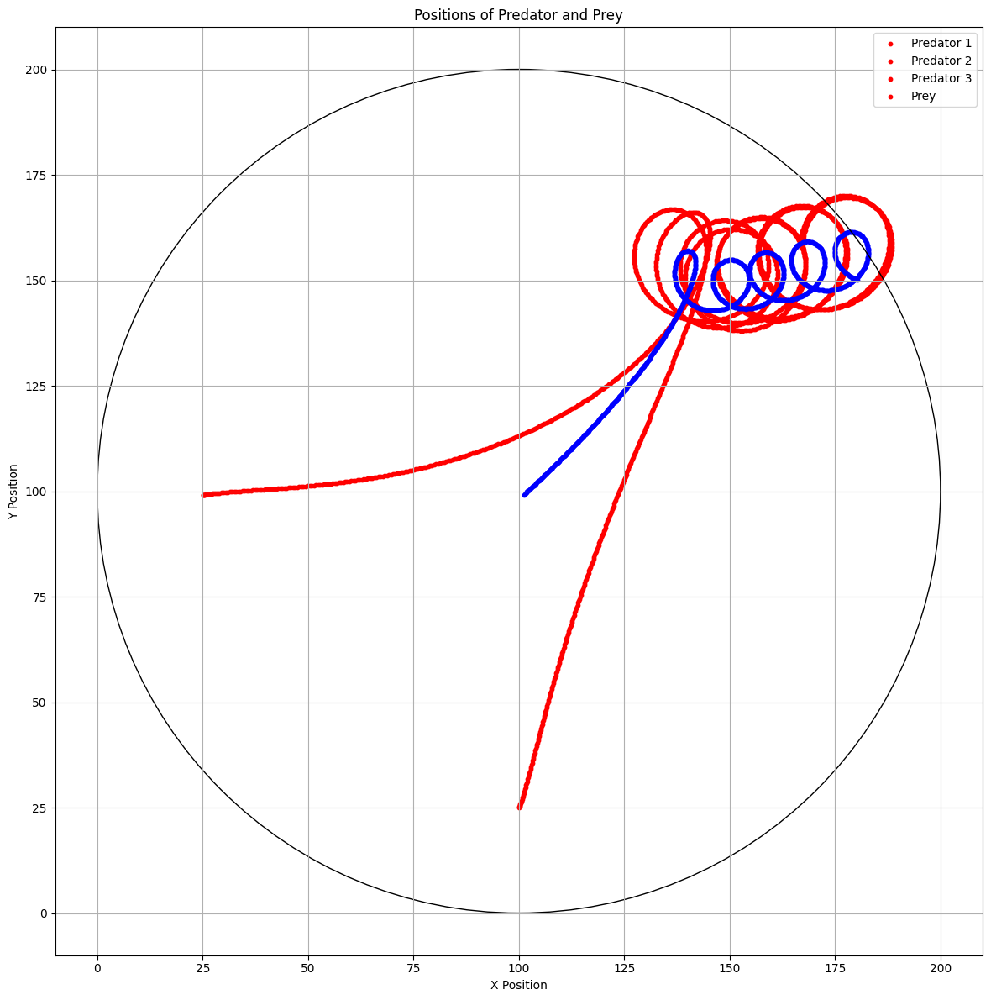

In [11]:
world.plot(0)

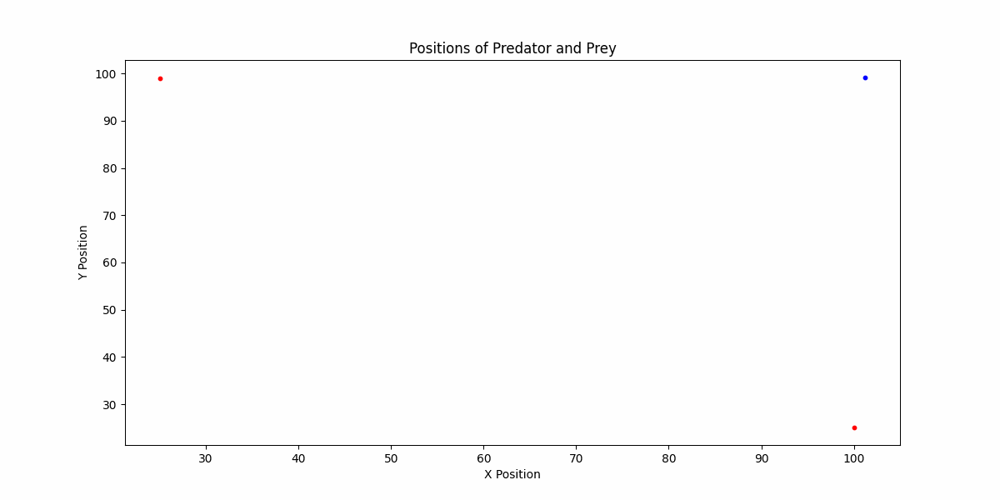

In [12]:
world.animate(0)

In [131]:
num_episodes = 1000
max_steps = 300
min_distance = 2

predators2 = [Predator(position=(50,50)), Predator(position=(40,90)), Predator(position=(60,90))]
prey2 = Prey(position=(50,70), velocity=[1,0])
world2 = World(prey2, predators2, "world2")
world2.simulate(num_episodes, max_steps, min_distance)

Simulating..:   0%|          | 0/1000 [00:00<?, ?it/s]

Predator ate prey at step 211 in episode 3
Predator ate prey at step 33 in episode 4
Predator ate prey at step 37 in episode 5
Predator ate prey at step 34 in episode 6
Predator ate prey at step 36 in episode 7
Predator ate prey at step 104 in episode 8
Predator ate prey at step 84 in episode 11
Predator ate prey at step 145 in episode 136
Predator ate prey at step 17 in episode 137
Predator ate prey at step 18 in episode 138
Predator ate prey at step 20 in episode 139
Predator ate prey at step 19 in episode 140
Predator ate prey at step 22 in episode 141
Predator ate prey at step 24 in episode 142
Predator ate prey at step 25 in episode 143
Predator ate prey at step 26 in episode 144
Predator ate prey at step 26 in episode 145
Predator ate prey at step 26 in episode 146
Predator ate prey at step 26 in episode 147
Predator ate prey at step 26 in episode 148
Predator ate prey at step 26 in episode 149
Predator ate prey at step 27 in episode 150
Predator ate prey at step 27 in episode 15

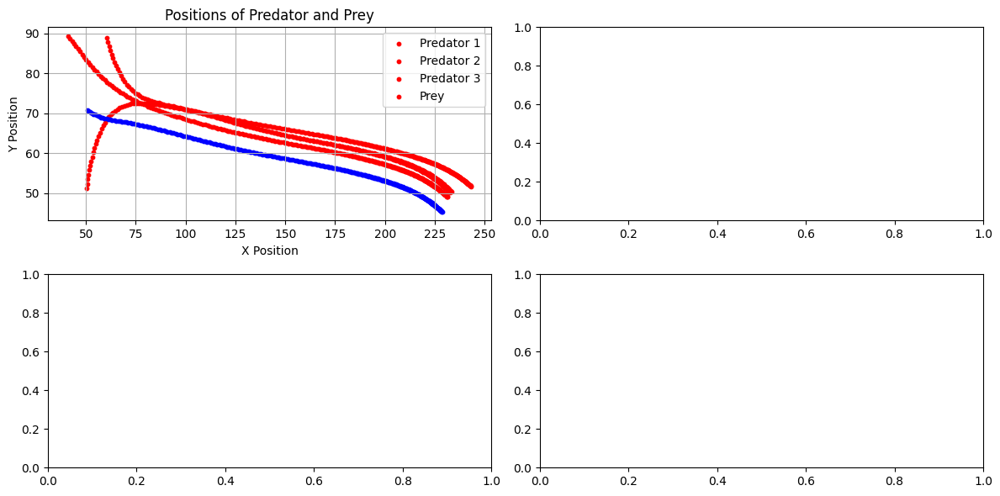

In [132]:
world2.plot(0)

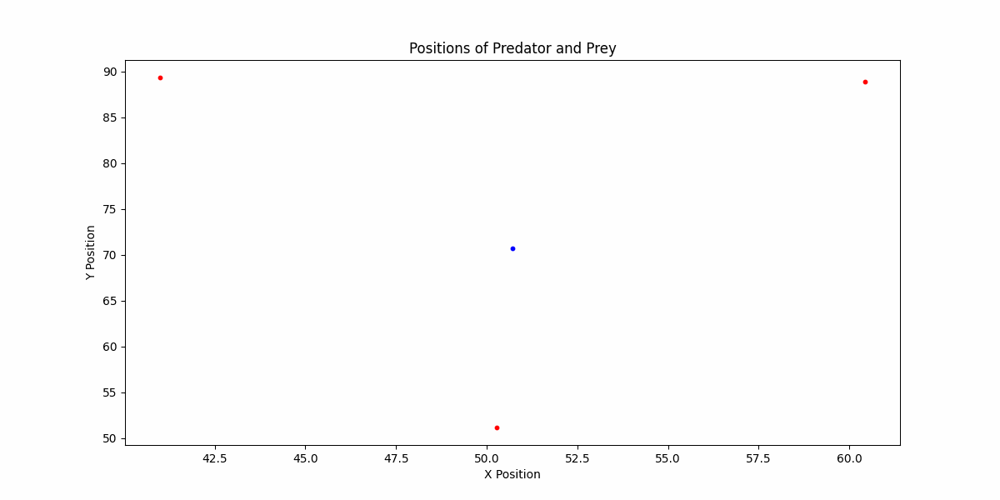

In [134]:
world2.animate(0)

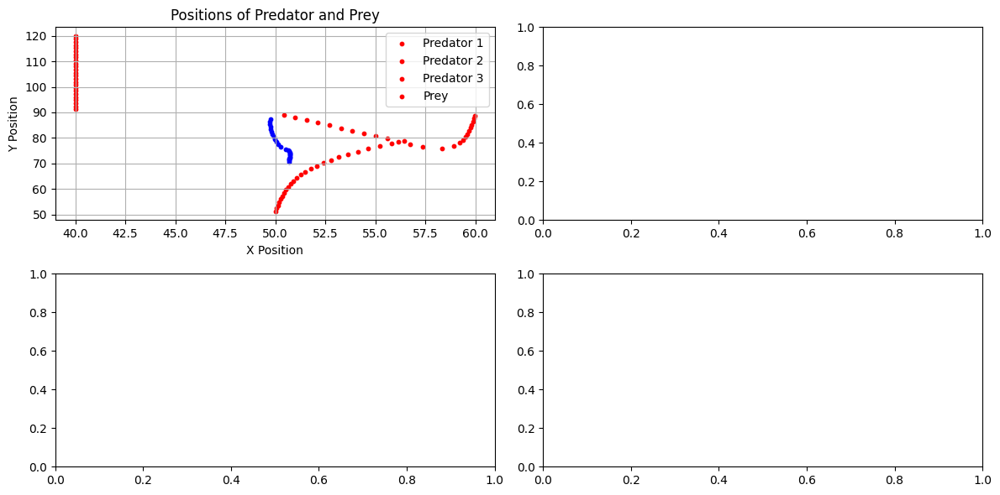

In [135]:
world2.plot(499)

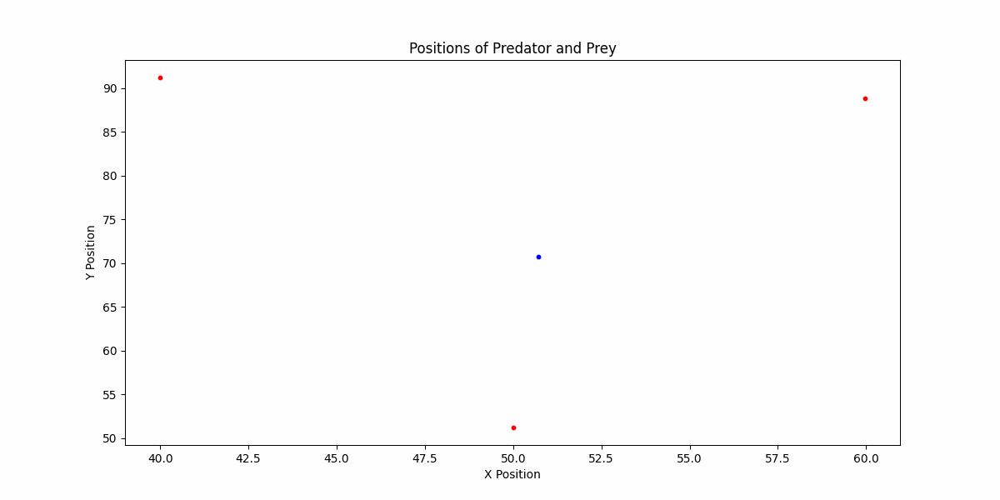

In [136]:
world2.animate(499)

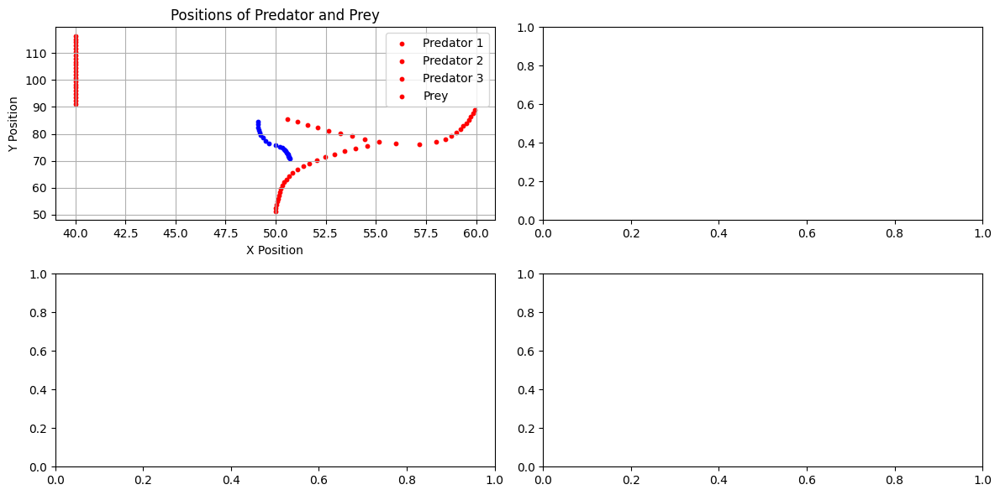

In [137]:
world2.plot(999)

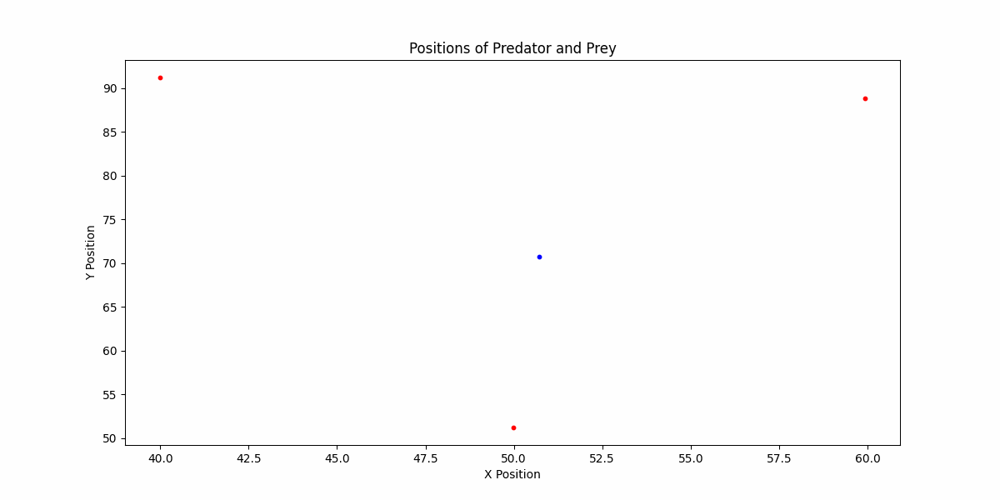

In [138]:
world2.animate(999)

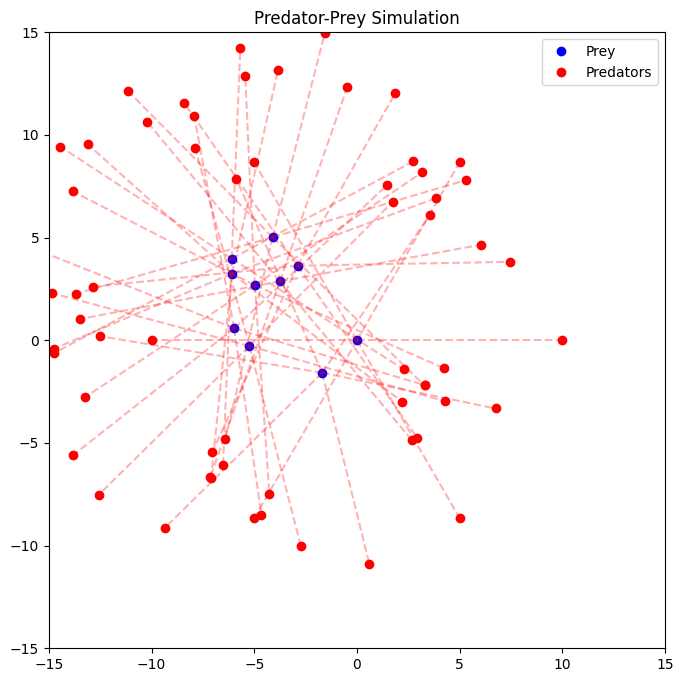

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# Simulation parameters
NUM_PREDATORS = 6
PREDATOR_RADIUS = 0.5
PREY_RADIUS = 0.5
PREY_SPEED = 1.0
PREDATOR_SPEED = 0.5
CENTER_RADIUS = 10
TIME_STEPS = 100

# Initialize positions
prey_pos = np.array([0.0, 0.0])
predators = []
angles = np.linspace(0, 2 * np.pi, NUM_PREDATORS, endpoint=False)
for angle in angles:
	x = prey_pos[0] + CENTER_RADIUS * np.cos(angle)
	y = prey_pos[1] + CENTER_RADIUS * np.sin(angle)
	predators.append([x, y])
predators = np.array(predators)

# Discrete simulation
prey_positions = [prey_pos.copy()]
predator_positions = [predators.copy()]

for t in range(TIME_STEPS):
	# Prey movement (simple wandering behavior)
	prey_pos += np.random.uniform(-PREY_SPEED, PREY_SPEED, size=2)

	# Predator movement (circle prey)
	for i, predator in enumerate(predators):
		dx = prey_pos[0] - predator[0]
		dy = prey_pos[1] - predator[1]
		distance = np.sqrt(dx**2 + dy**2)

		# Maintain circular formation
		target_x = prey_pos[0] + CENTER_RADIUS * np.cos(angles[i])
		target_y = prey_pos[1] + CENTER_RADIUS * np.sin(angles[i])

		angle_to_target = np.arctan2(target_y - predator[1], target_x - predator[0])
		predator[0] += PREDATOR_SPEED * np.cos(angle_to_target)
		predator[1] += PREDATOR_SPEED * np.sin(angle_to_target)

		# Update angle to maintain formation
		angles[i] += 0.01

	# Record positions
	prey_positions.append(prey_pos.copy())
	predator_positions.append(predators.copy())

# Plot the simulation
fig, ax = plt.subplots(figsize=(8, 8))
for t in range(0, TIME_STEPS, 10):
	prey_pos = prey_positions[t]
	predators = predator_positions[t]

	# Plot prey
	ax.plot(prey_pos[0], prey_pos[1], 'bo', label='Prey' if t == 0 else "")

	# Plot predators
	ax.plot(predators[:, 0], predators[:, 1], 'ro', label='Predators' if t == 0 else "")

	# Connect predators to form a circle
	for predator in predators:
		ax.plot([prey_pos[0], predator[0]], [prey_pos[1], predator[1]], 'r--', alpha=0.3)

ax.set_xlim(-CENTER_RADIUS - 5, CENTER_RADIUS + 5)
ax.set_ylim(-CENTER_RADIUS - 5, CENTER_RADIUS + 5)
ax.set_aspect('equal')
ax.legend()
plt.title("Predator-Prey Simulation")
plt.show()